<a href="https://colab.research.google.com/github/ramnagella/Demo/blob/master/DA_Day11.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#-DA ---Pandas Basics---26 and 28-08-2024

#Data Analysis(ETL)---Past data to understand what happened so far
#1.Data Gathering 2.Data Collection 3.Data Cleaning 4. Data Anylysis (EDA)
#5Data interpretation and 6. data visualisation


In [ ]:
#Prblem Statement----Covid data analysis--Conformed---recovered caes and death cases.
#Different data sources available --
#1.Confirmed,death,recovered cases in country and date wise not state wise as data is there in country and state wise
#Need to group the data for the country and date wise --here new data set will generated based on original dataset
#Confirmed_global.csv
#conformed,death and recovered cases are in cumsum() manner--calculate new conformed,death and recovered cases for  each date
#wget download files from any web servers or repository
# Data collection--download and load data set into pamdas


In [ ]:
#Data gathering  and collection
#Covid 19 analysis --as of now,covid active,confiormed,death
#https://github.com/CSSEGISandData/COVID-19/tree/master/csse_covid_19_data/csse_covid_19_time_series

In [3]:
!pip install wget

  Preparing metadata (setup.py) ... done
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9655 sha256=0453a2a72bd7c4bd1220e866ff997696ff0c3ae2b6371f6317becadcf6194017
  Stored in directory: /root/.cache/pip/wheels/40/b3/0f/a40dbd1c6861731779f62cc4babcb234387e11d697df70ee97
Successfully built wget


In [4]:
#wget download files from any web servers or repository
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import wget
import requests


In [27]:
!pip install requests

In [5]:
requests.get(url)

NameError: name 'url' is not defined

In [29]:
#Data Collections
urls=['https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_deaths_global.csv'
      'https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_confirmed_global.csv'
      'https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_recovered_global.csv']

In [31]:
[wget.download(url) for url in urls]
#downloading all the files using for loop getting error ,hence tried to download individual files as bwlow

HTTPError: HTTP Error 404: Not Found

In [9]:
wget.download('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/refs/heads/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_confirmed_global.csv')

'time_series_covid19_confirmed_global.csv'

In [8]:
wget.download('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/refs/heads/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_deaths_global.csv')

'time_series_covid19_deaths_global.csv'

In [7]:
wget.download('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/refs/heads/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_recovered_global.csv')

'time_series_covid19_recovered_global.csv'

In [10]:
#loading the data set and extracting the dataset
confirmed_df=pd.read_csv('time_series_covid19_confirmed_global.csv')
confirmed_df

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,2/28/23,3/1/23,3/2/23,3/3/23,3/4/23,3/5/23,3/6/23,3/7/23,3/8/23,3/9/23
0,NaN,Afghanistan,33.939110,67.709953,0,0,0,0,0,0,...,209322,209340,209358,209362,209369,209390,209406,209436,209451,209451
1,NaN,Albania,41.153300,20.168300,0,0,0,0,0,0,...,334391,334408,334408,334427,334427,334427,334427,334427,334443,334457
2,NaN,Algeria,28.033900,1.659600,0,0,0,0,0,0,...,271441,271448,271463,271469,271469,271477,271477,271490,271494,271496
3,NaN,Andorra,42.506300,1.521800,0,0,0,0,0,0,...,47866,47875,47875,47875,47875,47875,47875,47875,47890,47890
4,NaN,Angola,-11.202700,17.873900,0,0,0,0,0,0,...,105255,105277,105277,105277,105277,105277,105277,105277,105288,105288
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
284,NaN,West Bank and Gaza,31.952200,35.233200,0,0,0,0,0,0,...,703228,703228,703228,703228,703228,703228,703228,703228,703228,703228
285,NaN,Winter Olympics 2022,39.904200,116.407400,0,0,0,0,0,0,...,535,535,535,535,535,535,535,535,535,535
286,NaN,Yemen,15.552727,48.516388,0,0,0,0,0,0,...,11945,11945,11945,11945,11945,11945,11945,11945,11945,11945
287,NaN,Zambia,-13.133897,27.849332,0,0,0,0,0,0,...,343012,343012,343079,343079,343079,343135,343135,343135,343135,343135


In [11]:
deaths_df=pd.read_csv('time_series_covid19_deaths_global.csv')
deaths_df

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,2/28/23,3/1/23,3/2/23,3/3/23,3/4/23,3/5/23,3/6/23,3/7/23,3/8/23,3/9/23
0,NaN,Afghanistan,33.939110,67.709953,0,0,0,0,0,0,...,7896,7896,7896,7896,7896,7896,7896,7896,7896,7896
1,NaN,Albania,41.153300,20.168300,0,0,0,0,0,0,...,3598,3598,3598,3598,3598,3598,3598,3598,3598,3598
2,NaN,Algeria,28.033900,1.659600,0,0,0,0,0,0,...,6881,6881,6881,6881,6881,6881,6881,6881,6881,6881
3,NaN,Andorra,42.506300,1.521800,0,0,0,0,0,0,...,165,165,165,165,165,165,165,165,165,165
4,NaN,Angola,-11.202700,17.873900,0,0,0,0,0,0,...,1933,1933,1933,1933,1933,1933,1933,1933,1933,1933
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
284,NaN,West Bank and Gaza,31.952200,35.233200,0,0,0,0,0,0,...,5708,5708,5708,5708,5708,5708,5708,5708,5708,5708
285,NaN,Winter Olympics 2022,39.904200,116.407400,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
286,NaN,Yemen,15.552727,48.516388,0,0,0,0,0,0,...,2159,2159,2159,2159,2159,2159,2159,2159,2159,2159
287,NaN,Zambia,-13.133897,27.849332,0,0,0,0,0,0,...,4057,4057,4057,4057,4057,4057,4057,4057,4057,4057


In [12]:
recovered_df=pd.read_csv('time_series_covid19_recovered_global.csv')
recovered_df

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,2/28/23,3/1/23,3/2/23,3/3/23,3/4/23,3/5/23,3/6/23,3/7/23,3/8/23,3/9/23
0,NaN,Afghanistan,33.939110,67.709953,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,NaN,Albania,41.153300,20.168300,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,NaN,Algeria,28.033900,1.659600,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,NaN,Andorra,42.506300,1.521800,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,NaN,Angola,-11.202700,17.873900,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
269,NaN,West Bank and Gaza,31.952200,35.233200,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
270,NaN,Winter Olympics 2022,39.904200,116.407400,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
271,NaN,Yemen,15.552727,48.516388,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
272,NaN,Zambia,-13.133897,27.849332,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [13]:
confirmed_df.head()

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,2/28/23,3/1/23,3/2/23,3/3/23,3/4/23,3/5/23,3/6/23,3/7/23,3/8/23,3/9/23
0,NaN,Afghanistan,33.93911,67.709953,0,0,0,0,0,0,...,209322,209340,209358,209362,209369,209390,209406,209436,209451,209451
1,NaN,Albania,41.15330,20.168300,0,0,0,0,0,0,...,334391,334408,334408,334427,334427,334427,334427,334427,334443,334457
2,NaN,Algeria,28.03390,1.659600,0,0,0,0,0,0,...,271441,271448,271463,271469,271469,271477,271477,271490,271494,271496
3,NaN,Andorra,42.50630,1.521800,0,0,0,0,0,0,...,47866,47875,47875,47875,47875,47875,47875,47875,47890,47890
4,NaN,Angola,-11.20270,17.873900,0,0,0,0,0,0,...,105255,105277,105277,105277,105277,105277,105277,105277,105288,105288


In [14]:
confirmed_df.tail()

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,2/28/23,3/1/23,3/2/23,3/3/23,3/4/23,3/5/23,3/6/23,3/7/23,3/8/23,3/9/23
284,NaN,West Bank and Gaza,31.952200,35.233200,0,0,0,0,0,0,...,703228,703228,703228,703228,703228,703228,703228,703228,703228,703228
285,NaN,Winter Olympics 2022,39.904200,116.407400,0,0,0,0,0,0,...,535,535,535,535,535,535,535,535,535,535
286,NaN,Yemen,15.552727,48.516388,0,0,0,0,0,0,...,11945,11945,11945,11945,11945,11945,11945,11945,11945,11945
287,NaN,Zambia,-13.133897,27.849332,0,0,0,0,0,0,...,343012,343012,343079,343079,343079,343135,343135,343135,343135,343135
288,NaN,Zimbabwe,-19.015438,29.154857,0,0,0,0,0,0,...,263921,264127,264127,264127,264127,264127,264127,264127,264276,264276


In [15]:
#After converting them into DF we need to check how many no of rows and columns are there in three DF'
#Here columns are same for all three DF'sand no need to worry abt the no of rows
confirmed_df.shape

(289, 1147)

In [16]:
deaths_df.shape

(289, 1147)

In [17]:
recovered_df.shape

(274, 1147)

In [18]:
# what columns are available in all three DF's
#if you want merge three diff DF's we need to check what are the unique columns in all three DF's
#provice/state ,country/region,lat,lon four fields are unique and rest of column fileds are unique
#other columns like date, date wise will get different values for different columns or contries
confirmed_df.columns

Index(['Province/State', 'Country/Region', 'Lat', 'Long', '1/22/20', '1/23/20',
       '1/24/20', '1/25/20', '1/26/20', '1/27/20',
       ...
       '2/28/23', '3/1/23', '3/2/23', '3/3/23', '3/4/23', '3/5/23', '3/6/23',
       '3/7/23', '3/8/23', '3/9/23'],
      dtype='object', length=1147)

In [19]:
deaths_df.columns

Index(['Province/State', 'Country/Region', 'Lat', 'Long', '1/22/20', '1/23/20',
       '1/24/20', '1/25/20', '1/26/20', '1/27/20',
       ...
       '2/28/23', '3/1/23', '3/2/23', '3/3/23', '3/4/23', '3/5/23', '3/6/23',
       '3/7/23', '3/8/23', '3/9/23'],
      dtype='object', length=1147)

In [20]:
#Merge the DF's 2*2 not all three together
#merging death,cofirmed and recovered DF's ---Transpose all data columns into values (means row )
#but We can also convert only few columns into rows and other same as columns only
#Here in all three DF's first four column fileds are same or unique and will keep them as columns only and rest ofthem
# will be converted into ROWS
#Now our new DF will be After first four columsn other new column added like ad date and other dates will be in rows for  confirmed,death,and recoverd cases
#Segregating only columns
dates=confirmed_df.columns[4:]
dates


Index(['1/22/20', '1/23/20', '1/24/20', '1/25/20', '1/26/20', '1/27/20',
       '1/28/20', '1/29/20', '1/30/20', '1/31/20',
       ...
       '2/28/23', '3/1/23', '3/2/23', '3/3/23', '3/4/23', '3/5/23', '3/6/23',
       '3/7/23', '3/8/23', '3/9/23'],
      dtype='object', length=1143)

In [21]:
#Converting dates from wide format into long format means columns into rows
conformed_df_long=confirmed_df.melt(id_vars=['Province/State','Country/Region','Lat','Long'],value_name='confirmed',var_name='date')
conformed_df_long

,Province/State,Country/Region,Lat,Long,date,confirmed
0,NaN,Afghanistan,33.939110,67.709953,1/22/20,0
1,NaN,Albania,41.153300,20.168300,1/22/20,0
2,NaN,Algeria,28.033900,1.659600,1/22/20,0
3,NaN,Andorra,42.506300,1.521800,1/22/20,0
4,NaN,Angola,-11.202700,17.873900,1/22/20,0
...,...,...,...,...,...,...
330322,NaN,West Bank and Gaza,31.952200,35.233200,3/9/23,703228
330323,NaN,Winter Olympics 2022,39.904200,116.407400,3/9/23,535
330324,NaN,Yemen,15.552727,48.516388,3/9/23,11945
330325,NaN,Zambia,-13.133897,27.849332,3/9/23,343135


In [22]:
confirmed_df_long=confirmed_df.melt(
    id_vars=['Province/State','Country/Region','Lat','Long'],
    value_vars=dates,
    var_name='date',
    value_name='confirmed')
confirmed_df_long

,Province/State,Country/Region,Lat,Long,date,confirmed
0,NaN,Afghanistan,33.939110,67.709953,1/22/20,0
1,NaN,Albania,41.153300,20.168300,1/22/20,0
2,NaN,Algeria,28.033900,1.659600,1/22/20,0
3,NaN,Andorra,42.506300,1.521800,1/22/20,0
4,NaN,Angola,-11.202700,17.873900,1/22/20,0
...,...,...,...,...,...,...
330322,NaN,West Bank and Gaza,31.952200,35.233200,3/9/23,703228
330323,NaN,Winter Olympics 2022,39.904200,116.407400,3/9/23,535
330324,NaN,Yemen,15.552727,48.516388,3/9/23,11945
330325,NaN,Zambia,-13.133897,27.849332,3/9/23,343135


In [23]:
dates_death=confirmed_df.columns[4:]
dates_death

Index(['1/22/20', '1/23/20', '1/24/20', '1/25/20', '1/26/20', '1/27/20',
       '1/28/20', '1/29/20', '1/30/20', '1/31/20',
       ...
       '2/28/23', '3/1/23', '3/2/23', '3/3/23', '3/4/23', '3/5/23', '3/6/23',
       '3/7/23', '3/8/23', '3/9/23'],
      dtype='object', length=1143)

In [24]:
deaths_df_long=deaths_df.melt(
    id_vars=['Province/State','Country/Region','Lat','Long'],
    value_vars=dates_death,
    var_name='date',
    value_name='Deaths')
deaths_df_long

,Province/State,Country/Region,Lat,Long,date,Deaths
0,NaN,Afghanistan,33.939110,67.709953,1/22/20,0
1,NaN,Albania,41.153300,20.168300,1/22/20,0
2,NaN,Algeria,28.033900,1.659600,1/22/20,0
3,NaN,Andorra,42.506300,1.521800,1/22/20,0
4,NaN,Angola,-11.202700,17.873900,1/22/20,0
...,...,...,...,...,...,...
330322,NaN,West Bank and Gaza,31.952200,35.233200,3/9/23,5708
330323,NaN,Winter Olympics 2022,39.904200,116.407400,3/9/23,0
330324,NaN,Yemen,15.552727,48.516388,3/9/23,2159
330325,NaN,Zambia,-13.133897,27.849332,3/9/23,4057


In [25]:
dates_recov=recovered_df.columns[4:]
dates_recov

Index(['1/22/20', '1/23/20', '1/24/20', '1/25/20', '1/26/20', '1/27/20',
       '1/28/20', '1/29/20', '1/30/20', '1/31/20',
       ...
       '2/28/23', '3/1/23', '3/2/23', '3/3/23', '3/4/23', '3/5/23', '3/6/23',
       '3/7/23', '3/8/23', '3/9/23'],
      dtype='object', length=1143)

In [26]:
recovered_df_long=deaths_df.melt(
    id_vars=['Province/State','Country/Region','Lat','Long'],
    value_vars=dates_recov,
    var_name='date',
    value_name='Recovered')
recovered_df_long

,Province/State,Country/Region,Lat,Long,date,Recovered
0,NaN,Afghanistan,33.939110,67.709953,1/22/20,0
1,NaN,Albania,41.153300,20.168300,1/22/20,0
2,NaN,Algeria,28.033900,1.659600,1/22/20,0
3,NaN,Andorra,42.506300,1.521800,1/22/20,0
4,NaN,Angola,-11.202700,17.873900,1/22/20,0
...,...,...,...,...,...,...
330322,NaN,West Bank and Gaza,31.952200,35.233200,3/9/23,5708
330323,NaN,Winter Olympics 2022,39.904200,116.407400,3/9/23,0
330324,NaN,Yemen,15.552727,48.516388,3/9/23,2159
330325,NaN,Zambia,-13.133897,27.849332,3/9/23,4057


In [27]:
#After changing from wide to long will merge the Df's --merging--confirmed_df_long and deaths_df_long
#Here in this two DF's first 5 columns are same and only column is different
#how=left means left DF data is retained as it is and columns which are different from left DF in right DF are addedd
#Here only one column is different that is deaths in deaths_df_ling
full_table=confirmed_df_long.merge(
    right=deaths_df_long,
    how='left',
    on=['Province/State','Country/Region','date','Lat','Long']
)
full_table

,Province/State,Country/Region,Lat,Long,date,confirmed,Deaths
0,NaN,Afghanistan,33.939110,67.709953,1/22/20,0,0
1,NaN,Albania,41.153300,20.168300,1/22/20,0,0
2,NaN,Algeria,28.033900,1.659600,1/22/20,0,0
3,NaN,Andorra,42.506300,1.521800,1/22/20,0,0
4,NaN,Angola,-11.202700,17.873900,1/22/20,0,0
...,...,...,...,...,...,...,...
330322,NaN,West Bank and Gaza,31.952200,35.233200,3/9/23,703228,5708
330323,NaN,Winter Olympics 2022,39.904200,116.407400,3/9/23,535,0
330324,NaN,Yemen,15.552727,48.516388,3/9/23,11945,2159
330325,NaN,Zambia,-13.133897,27.849332,3/9/23,343135,4057


In [28]:
full_table_alias=confirmed_df_long.merge(right=deaths_df_long,how='left',on=['Province/State','Country/Region','date','Lat','Long'])
full_table_alias
#

,Province/State,Country/Region,Lat,Long,date,confirmed,Deaths
0,NaN,Afghanistan,33.939110,67.709953,1/22/20,0,0
1,NaN,Albania,41.153300,20.168300,1/22/20,0,0
2,NaN,Algeria,28.033900,1.659600,1/22/20,0,0
3,NaN,Andorra,42.506300,1.521800,1/22/20,0,0
4,NaN,Angola,-11.202700,17.873900,1/22/20,0,0
...,...,...,...,...,...,...,...
330322,NaN,West Bank and Gaza,31.952200,35.233200,3/9/23,703228,5708
330323,NaN,Winter Olympics 2022,39.904200,116.407400,3/9/23,535,0
330324,NaN,Yemen,15.552727,48.516388,3/9/23,11945,2159
330325,NaN,Zambia,-13.133897,27.849332,3/9/23,343135,4057


In [29]:
#Need to merge this full_table DF with Recovered DF
full_table=full_table.merge(
    right=recovered_df_long,
    how='left',
    on=['Province/State','Country/Region','date','Lat','Long']
)
full_table

,Province/State,Country/Region,Lat,Long,date,confirmed,Deaths,Recovered
0,NaN,Afghanistan,33.939110,67.709953,1/22/20,0,0,0
1,NaN,Albania,41.153300,20.168300,1/22/20,0,0,0
2,NaN,Algeria,28.033900,1.659600,1/22/20,0,0,0
3,NaN,Andorra,42.506300,1.521800,1/22/20,0,0,0
4,NaN,Angola,-11.202700,17.873900,1/22/20,0,0,0
...,...,...,...,...,...,...,...,...
330322,NaN,West Bank and Gaza,31.952200,35.233200,3/9/23,703228,5708,5708
330323,NaN,Winter Olympics 2022,39.904200,116.407400,3/9/23,535,0,0
330324,NaN,Yemen,15.552727,48.516388,3/9/23,11945,2159,2159
330325,NaN,Zambia,-13.133897,27.849332,3/9/23,343135,4057,4057


In [30]:
#If any missing values are there in recovered DF ,will get floating point values in merged DF
#To clean this final DF will fil the missing values with Zero's.using astype methid we can change the datatype
full_table['Recovered']=full_table['Recovered'].astype('int64')
full_table


,Province/State,Country/Region,Lat,Long,date,confirmed,Deaths,Recovered
0,NaN,Afghanistan,33.939110,67.709953,1/22/20,0,0,0
1,NaN,Albania,41.153300,20.168300,1/22/20,0,0,0
2,NaN,Algeria,28.033900,1.659600,1/22/20,0,0,0
3,NaN,Andorra,42.506300,1.521800,1/22/20,0,0,0
4,NaN,Angola,-11.202700,17.873900,1/22/20,0,0,0
...,...,...,...,...,...,...,...,...
330322,NaN,West Bank and Gaza,31.952200,35.233200,3/9/23,703228,5708,5708
330323,NaN,Winter Olympics 2022,39.904200,116.407400,3/9/23,535,0,0
330324,NaN,Yemen,15.552727,48.516388,3/9/23,11945,2159,2159
330325,NaN,Zambia,-13.133897,27.849332,3/9/23,343135,4057,4057


In [31]:
full_table.to_csv('merged_table.csv')

In [32]:
full_table.to_csv('merged_table.csv',index=False)
#Because there are two indexes are there in merged DF ,will ignore one using index=False

In [33]:
#4 Step---Perform Data Cleaning
full_table.describe()

,Lat,Long,confirmed,Deaths,Recovered
count,328041.000000,328041.000000,3.303270e+05,3.303270e+05,3.303270e+05
mean,19.718719,22.182084,9.593836e+05,1.338013e+04,1.338013e+04
std,25.911388,77.735268,4.866034e+06,6.389189e+04,6.389189e+04
min,-71.949900,-178.116500,0.000000e+00,0.000000e+00,0.000000e+00
25%,3.933900,-42.604300,6.800000e+02,3.000000e+00,3.000000e+00
50%,21.512583,20.939400,1.442900e+04,1.500000e+02,1.500000e+02
75%,40.463667,90.356300,2.285170e+05,3.032000e+03,3.032000e+03
max,71.706900,178.065000,1.038027e+08,1.123836e+06,1.123836e+06


In [34]:
full_table.describe(include='all')

,Province/State,Country/Region,Lat,Long,date,confirmed,Deaths,Recovered
count,104013,330327,328041.000000,328041.000000,330327,3.303270e+05,3.303270e+05,3.303270e+05
unique,91,201,NaN,NaN,1143,NaN,NaN,NaN
top,Australian Capital Territory,China,NaN,NaN,3/9/23,NaN,NaN,NaN
freq,1143,38862,NaN,NaN,289,NaN,NaN,NaN
mean,NaN,NaN,19.718719,22.182084,NaN,9.593836e+05,1.338013e+04,1.338013e+04
std,NaN,NaN,25.911388,77.735268,NaN,4.866034e+06,6.389189e+04,6.389189e+04
min,NaN,NaN,-71.949900,-178.116500,NaN,0.000000e+00,0.000000e+00,0.000000e+00
25%,NaN,NaN,3.933900,-42.604300,NaN,6.800000e+02,3.000000e+00,3.000000e+00
50%,NaN,NaN,21.512583,20.939400,NaN,1.442900e+04,1.500000e+02,1.500000e+02
75%,NaN,NaN,40.463667,90.356300,NaN,2.285170e+05,3.032000e+03,3.032000e+03


In [35]:
full_table.info()
#Please check any datatype mismtach we need to clean it like date is object is not correct data type
#recoverdd is also int no issues

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 330327 entries, 0 to 330326
Data columns (total 8 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   Province/State  104013 non-null  object 
 1   Country/Region  330327 non-null  object 
 2   Lat             328041 non-null  float64
 3   Long            328041 non-null  float64
 4   date            330327 non-null  object 
 5   confirmed       330327 non-null  int64  
 6   Deaths          330327 non-null  int64  
 7   Recovered       330327 non-null  int64  
dtypes: float64(2), int64(3), object(3)
memory usage: 20.2+ MB


In [36]:
#Date time conversion---
full_table['date']=pd.to_datetime(full_table['date'])

/tmp/ipython-input-36-1750610089.py:2: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  full_table['date']=pd.to_datetime(full_table['date'])


In [37]:
full_table.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 330327 entries, 0 to 330326
Data columns (total 8 columns):
 #   Column          Non-Null Count   Dtype         
---  ------          --------------   -----         
 0   Province/State  104013 non-null  object        
 1   Country/Region  330327 non-null  object        
 2   Lat             328041 non-null  float64       
 3   Long            328041 non-null  float64       
 4   date            330327 non-null  datetime64[ns]
 5   confirmed       330327 non-null  int64         
 6   Deaths          330327 non-null  int64         
 7   Recovered       330327 non-null  int64         
dtypes: datetime64[ns](1), float64(2), int64(3), object(2)
memory usage: 20.2+ MB


In [38]:
#Checking missing values --some of the cases need to fill and some of the cases need to drop
#NAN will be detected by following
full_table.isna().sum()

,0
Province/State,226314
Country/Region,0
Lat,2286
Long,2286
date,0
confirmed,0
Deaths,0
Recovered,0


In [39]:
#Filling missing values in recovered column
full_table['Recovered']=full_table['Recovered'].fillna(0)

In [72]:
full_table.isna().sum()

,0
Province/State,226314
Country/Region,0
Lat,2286
Long,2286
date,0
confirmed,0
Deaths,0
Recovered,0


In [40]:
full_table.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 330327 entries, 0 to 330326
Data columns (total 8 columns):
 #   Column          Non-Null Count   Dtype         
---  ------          --------------   -----         
 0   Province/State  104013 non-null  object        
 1   Country/Region  330327 non-null  object        
 2   Lat             328041 non-null  float64       
 3   Long            328041 non-null  float64       
 4   date            330327 non-null  datetime64[ns]
 5   confirmed       330327 non-null  int64         
 6   Deaths          330327 non-null  int64         
 7   Recovered       330327 non-null  int64         
dtypes: datetime64[ns](1), float64(2), int64(3), object(2)
memory usage: 20.2+ MB


In [ ]:
#Now cleaned ,transformed dataset is ready for analysis--Data preparation is complted .Analysis is next session

In [41]:
full_table.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 330327 entries, 0 to 330326
Data columns (total 8 columns):
 #   Column          Non-Null Count   Dtype         
---  ------          --------------   -----         
 0   Province/State  104013 non-null  object        
 1   Country/Region  330327 non-null  object        
 2   Lat             328041 non-null  float64       
 3   Long            328041 non-null  float64       
 4   date            330327 non-null  datetime64[ns]
 5   confirmed       330327 non-null  int64         
 6   Deaths          330327 non-null  int64         
 7   Recovered       330327 non-null  int64         
dtypes: datetime64[ns](1), float64(2), int64(3), object(2)
memory usage: 20.2+ MB


In [ ]:
#---DA ---Pandas Basics---28-08-2024

In [42]:
#How to calculate active cases---confirmed---minus---deaths+recovered ==Active
#Data aggregation----After cleaning --based on requirement need to create another fields.
full_table['Active']=full_table['confirmed']-full_table['Deaths']-full_table['Recovered']
full_table

,Province/State,Country/Region,Lat,Long,date,confirmed,Deaths,Recovered,Active
0,NaN,Afghanistan,33.939110,67.709953,2020-01-22,0,0,0,0
1,NaN,Albania,41.153300,20.168300,2020-01-22,0,0,0,0
2,NaN,Algeria,28.033900,1.659600,2020-01-22,0,0,0,0
3,NaN,Andorra,42.506300,1.521800,2020-01-22,0,0,0,0
4,NaN,Angola,-11.202700,17.873900,2020-01-22,0,0,0,0
...,...,...,...,...,...,...,...,...,...
330322,NaN,West Bank and Gaza,31.952200,35.233200,2023-03-09,703228,5708,5708,691812
330323,NaN,Winter Olympics 2022,39.904200,116.407400,2023-03-09,535,0,0,535
330324,NaN,Yemen,15.552727,48.516388,2023-03-09,11945,2159,2159,7627
330325,NaN,Zambia,-13.133897,27.849332,2023-03-09,343135,4057,4057,335021


In [43]:
full_table['Active_Till_Date']=full_table['Active'].cumsum()
full_table

,Province/State,Country/Region,Lat,Long,date,confirmed,Deaths,Recovered,Active,Active_Till_Date
0,NaN,Afghanistan,33.939110,67.709953,2020-01-22,0,0,0,0,0
1,NaN,Albania,41.153300,20.168300,2020-01-22,0,0,0,0,0
2,NaN,Algeria,28.033900,1.659600,2020-01-22,0,0,0,0,0
3,NaN,Andorra,42.506300,1.521800,2020-01-22,0,0,0,0,0
4,NaN,Angola,-11.202700,17.873900,2020-01-22,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...
330322,NaN,West Bank and Gaza,31.952200,35.233200,2023-03-09,703228,5708,5708,691812,308070066274
330323,NaN,Winter Olympics 2022,39.904200,116.407400,2023-03-09,535,0,0,535,308070066809
330324,NaN,Yemen,15.552727,48.516388,2023-03-09,11945,2159,2159,7627,308070074436
330325,NaN,Zambia,-13.133897,27.849332,2023-03-09,343135,4057,4057,335021,308070409457


In [44]:
full_table.to_csv('Active_Till_Date.csv',index=False)
#These active cases are not correct because dates are duplicates .we need to group the dates and also in a counry there aee many states are there
#We need to group by date and group by country
full_table

,Province/State,Country/Region,Lat,Long,date,confirmed,Deaths,Recovered,Active,Active_Till_Date
0,NaN,Afghanistan,33.939110,67.709953,2020-01-22,0,0,0,0,0
1,NaN,Albania,41.153300,20.168300,2020-01-22,0,0,0,0,0
2,NaN,Algeria,28.033900,1.659600,2020-01-22,0,0,0,0,0
3,NaN,Andorra,42.506300,1.521800,2020-01-22,0,0,0,0,0
4,NaN,Angola,-11.202700,17.873900,2020-01-22,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...
330322,NaN,West Bank and Gaza,31.952200,35.233200,2023-03-09,703228,5708,5708,691812,308070066274
330323,NaN,Winter Olympics 2022,39.904200,116.407400,2023-03-09,535,0,0,535,308070066809
330324,NaN,Yemen,15.552727,48.516388,2023-03-09,11945,2159,2159,7627,308070074436
330325,NaN,Zambia,-13.133897,27.849332,2023-03-09,343135,4057,4057,335021,308070409457


In [45]:
full_table.drop('Active_Till_Date',axis=1,inplace=True)
full_table

,Province/State,Country/Region,Lat,Long,date,confirmed,Deaths,Recovered,Active
0,NaN,Afghanistan,33.939110,67.709953,2020-01-22,0,0,0,0
1,NaN,Albania,41.153300,20.168300,2020-01-22,0,0,0,0
2,NaN,Algeria,28.033900,1.659600,2020-01-22,0,0,0,0
3,NaN,Andorra,42.506300,1.521800,2020-01-22,0,0,0,0
4,NaN,Angola,-11.202700,17.873900,2020-01-22,0,0,0,0
...,...,...,...,...,...,...,...,...,...
330322,NaN,West Bank and Gaza,31.952200,35.233200,2023-03-09,703228,5708,5708,691812
330323,NaN,Winter Olympics 2022,39.904200,116.407400,2023-03-09,535,0,0,535
330324,NaN,Yemen,15.552727,48.516388,2023-03-09,11945,2159,2159,7627
330325,NaN,Zambia,-13.133897,27.849332,2023-03-09,343135,4057,4057,335021


In [99]:
#We need to group by date and group by country
full_grouped=full_table.groupby(['date','Country/Region'])['confirmed','Deaths','Recovered','Active'].sum(),reset_index()

ValueError: Cannot subset columns with a tuple with more than one element. Use a list instead.

In [46]:
full_grouped=full_table.groupby(['Country/Region','date'])
full_grouped

In [47]:
full_grouped

In [49]:
country_date_covid_data=full_grouped.sum().reset_index()

In [51]:
new_df_covid_data=country_date_covid_data.loc[:,['Country/Region','date','Lat','Long','confirmed','Deaths','Recovered']]
new_df_covid_data

,Country/Region,date,Lat,Long,confirmed,Deaths,Recovered
0,Afghanistan,2020-01-22,33.939110,67.709953,0,0,0
1,Afghanistan,2020-01-23,33.939110,67.709953,0,0,0
2,Afghanistan,2020-01-24,33.939110,67.709953,0,0,0
3,Afghanistan,2020-01-25,33.939110,67.709953,0,0,0
4,Afghanistan,2020-01-26,33.939110,67.709953,0,0,0
...,...,...,...,...,...,...,...
229738,Zimbabwe,2023-03-05,-19.015438,29.154857,264127,5668,5668
229739,Zimbabwe,2023-03-06,-19.015438,29.154857,264127,5668,5668
229740,Zimbabwe,2023-03-07,-19.015438,29.154857,264127,5668,5668
229741,Zimbabwe,2023-03-08,-19.015438,29.154857,264276,5671,5671


In [52]:
new_df_covid_data.to_csv('country_date_wise.csv',index=False)

In [53]:
new_df_covid_data['Active_Cases_Per_day']=new_df_covid_data['confirmed']-new_df_covid_data['Deaths']-new_df_covid_data['Recovered']
new_df_covid_data

,Country/Region,date,Lat,Long,confirmed,Deaths,Recovered,Active_Cases_Per_day
0,Afghanistan,2020-01-22,33.939110,67.709953,0,0,0,0
1,Afghanistan,2020-01-23,33.939110,67.709953,0,0,0,0
2,Afghanistan,2020-01-24,33.939110,67.709953,0,0,0,0
3,Afghanistan,2020-01-25,33.939110,67.709953,0,0,0,0
4,Afghanistan,2020-01-26,33.939110,67.709953,0,0,0,0
...,...,...,...,...,...,...,...,...
229738,Zimbabwe,2023-03-05,-19.015438,29.154857,264127,5668,5668,252791
229739,Zimbabwe,2023-03-06,-19.015438,29.154857,264127,5668,5668,252791
229740,Zimbabwe,2023-03-07,-19.015438,29.154857,264127,5668,5668,252791
229741,Zimbabwe,2023-03-08,-19.015438,29.154857,264276,5671,5671,252934


In [54]:
new_df_covid_data['Active_Cases_Till_Date']=new_df_covid_data['Active_Cases_Per_day'].cumsum()
new_df_covid_data

,Country/Region,date,Lat,Long,confirmed,Deaths,Recovered,Active_Cases_Per_day,Active_Cases_Till_Date
0,Afghanistan,2020-01-22,33.939110,67.709953,0,0,0,0,0
1,Afghanistan,2020-01-23,33.939110,67.709953,0,0,0,0,0
2,Afghanistan,2020-01-24,33.939110,67.709953,0,0,0,0,0
3,Afghanistan,2020-01-25,33.939110,67.709953,0,0,0,0,0
4,Afghanistan,2020-01-26,33.939110,67.709953,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...
229738,Zimbabwe,2023-03-05,-19.015438,29.154857,264127,5668,5668,252791,308069650941
229739,Zimbabwe,2023-03-06,-19.015438,29.154857,264127,5668,5668,252791,308069903732
229740,Zimbabwe,2023-03-07,-19.015438,29.154857,264127,5668,5668,252791,308070156523
229741,Zimbabwe,2023-03-08,-19.015438,29.154857,264276,5671,5671,252934,308070409457


In [55]:
new_df_covid_data['Active_Cases_Till_Date']=new_df_covid_data['Active_Cases_Per_day'].cumsum()
new_df_covid_data

,Country/Region,date,Lat,Long,confirmed,Deaths,Recovered,Active_Cases_Per_day,Active_Cases_Till_Date
0,Afghanistan,2020-01-22,33.939110,67.709953,0,0,0,0,0
1,Afghanistan,2020-01-23,33.939110,67.709953,0,0,0,0,0
2,Afghanistan,2020-01-24,33.939110,67.709953,0,0,0,0,0
3,Afghanistan,2020-01-25,33.939110,67.709953,0,0,0,0,0
4,Afghanistan,2020-01-26,33.939110,67.709953,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...
229738,Zimbabwe,2023-03-05,-19.015438,29.154857,264127,5668,5668,252791,308069650941
229739,Zimbabwe,2023-03-06,-19.015438,29.154857,264127,5668,5668,252791,308069903732
229740,Zimbabwe,2023-03-07,-19.015438,29.154857,264127,5668,5668,252791,308070156523
229741,Zimbabwe,2023-03-08,-19.015438,29.154857,264276,5671,5671,252934,308070409457


In [57]:
new_df_covid_data.drop('Active_Cases_Per_day',axis=1,inplace=True)
new_df_covid_data

,Country/Region,date,Lat,Long,confirmed,Deaths,Recovered,Active_Cases_Till_Date
0,Afghanistan,2020-01-22,33.939110,67.709953,0,0,0,0
1,Afghanistan,2020-01-23,33.939110,67.709953,0,0,0,0
2,Afghanistan,2020-01-24,33.939110,67.709953,0,0,0,0
3,Afghanistan,2020-01-25,33.939110,67.709953,0,0,0,0
4,Afghanistan,2020-01-26,33.939110,67.709953,0,0,0,0
...,...,...,...,...,...,...,...,...
229738,Zimbabwe,2023-03-05,-19.015438,29.154857,264127,5668,5668,308069650941
229739,Zimbabwe,2023-03-06,-19.015438,29.154857,264127,5668,5668,308069903732
229740,Zimbabwe,2023-03-07,-19.015438,29.154857,264127,5668,5668,308070156523
229741,Zimbabwe,2023-03-08,-19.015438,29.154857,264276,5671,5671,308070409457


In [58]:
new_df_covid_data['Active_Cases_Per_day']=new_df_covid_data['Active_Cases_Till_Date'].diff()
new_df_covid_data

,Country/Region,date,Lat,Long,confirmed,Deaths,Recovered,Active_Cases_Till_Date,Active_Cases_Per_day
0,Afghanistan,2020-01-22,33.939110,67.709953,0,0,0,0,NaN
1,Afghanistan,2020-01-23,33.939110,67.709953,0,0,0,0,0.0
2,Afghanistan,2020-01-24,33.939110,67.709953,0,0,0,0,0.0
3,Afghanistan,2020-01-25,33.939110,67.709953,0,0,0,0,0.0
4,Afghanistan,2020-01-26,33.939110,67.709953,0,0,0,0,0.0
...,...,...,...,...,...,...,...,...,...
229738,Zimbabwe,2023-03-05,-19.015438,29.154857,264127,5668,5668,308069650941,252791.0
229739,Zimbabwe,2023-03-06,-19.015438,29.154857,264127,5668,5668,308069903732,252791.0
229740,Zimbabwe,2023-03-07,-19.015438,29.154857,264127,5668,5668,308070156523,252791.0
229741,Zimbabwe,2023-03-08,-19.015438,29.154857,264276,5671,5671,308070409457,252934.0


In [59]:
new_df_covid_data.to_csv('active_cases_per_Day_new.csv',index=False)
#In Active cases perday new some times will get negative values , we need oto handle or clean those values
#using the below code

In [61]:
new_df_covid_data['Active_Cases_Per_day']=new_df_covid_data['Active_Cases_Per_day'].apply(lambda x:0 if x<0 else x)
new_df_covid_data

,Country/Region,date,Lat,Long,confirmed,Deaths,Recovered,Active_Cases_Till_Date,Active_Cases_Per_day
0,Afghanistan,2020-01-22,33.939110,67.709953,0,0,0,0,NaN
1,Afghanistan,2020-01-23,33.939110,67.709953,0,0,0,0,0.0
2,Afghanistan,2020-01-24,33.939110,67.709953,0,0,0,0,0.0
3,Afghanistan,2020-01-25,33.939110,67.709953,0,0,0,0,0.0
4,Afghanistan,2020-01-26,33.939110,67.709953,0,0,0,0,0.0
...,...,...,...,...,...,...,...,...,...
229738,Zimbabwe,2023-03-05,-19.015438,29.154857,264127,5668,5668,308069650941,252791.0
229739,Zimbabwe,2023-03-06,-19.015438,29.154857,264127,5668,5668,308069903732,252791.0
229740,Zimbabwe,2023-03-07,-19.015438,29.154857,264127,5668,5668,308070156523,252791.0
229741,Zimbabwe,2023-03-08,-19.015438,29.154857,264276,5671,5671,308070409457,252934.0


In [63]:
new_df_covid_data['Active_Cases_Per_day']=new_df_covid_data['Active_Cases_Per_day'].fillna(0)

In [64]:
new_df_covid_data

,Country/Region,date,Lat,Long,confirmed,Deaths,Recovered,Active_Cases_Till_Date,Active_Cases_Per_day
0,Afghanistan,2020-01-22,33.939110,67.709953,0,0,0,0,0.0
1,Afghanistan,2020-01-23,33.939110,67.709953,0,0,0,0,0.0
2,Afghanistan,2020-01-24,33.939110,67.709953,0,0,0,0,0.0
3,Afghanistan,2020-01-25,33.939110,67.709953,0,0,0,0,0.0
4,Afghanistan,2020-01-26,33.939110,67.709953,0,0,0,0,0.0
...,...,...,...,...,...,...,...,...,...
229738,Zimbabwe,2023-03-05,-19.015438,29.154857,264127,5668,5668,308069650941,252791.0
229739,Zimbabwe,2023-03-06,-19.015438,29.154857,264127,5668,5668,308069903732,252791.0
229740,Zimbabwe,2023-03-07,-19.015438,29.154857,264127,5668,5668,308070156523,252791.0
229741,Zimbabwe,2023-03-08,-19.015438,29.154857,264276,5671,5671,308070409457,252934.0


In [65]:
#changing data format of Active_cases_perday into int 64 from float --it is cleaning process
new_df_covid_data['Active_Cases_Per_day']=new_df_covid_data['Active_Cases_Per_day'].astype('int64')
new_df_covid_data

,Country/Region,date,Lat,Long,confirmed,Deaths,Recovered,Active_Cases_Till_Date,Active_Cases_Per_day
0,Afghanistan,2020-01-22,33.939110,67.709953,0,0,0,0,0
1,Afghanistan,2020-01-23,33.939110,67.709953,0,0,0,0,0
2,Afghanistan,2020-01-24,33.939110,67.709953,0,0,0,0,0
3,Afghanistan,2020-01-25,33.939110,67.709953,0,0,0,0,0
4,Afghanistan,2020-01-26,33.939110,67.709953,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...
229738,Zimbabwe,2023-03-05,-19.015438,29.154857,264127,5668,5668,308069650941,252791
229739,Zimbabwe,2023-03-06,-19.015438,29.154857,264127,5668,5668,308069903732,252791
229740,Zimbabwe,2023-03-07,-19.015438,29.154857,264127,5668,5668,308070156523,252791
229741,Zimbabwe,2023-03-08,-19.015438,29.154857,264276,5671,5671,308070409457,252934


In [66]:
#After this EDA process need to visualise the data.
new_df_covid_data.sort_values(by='date',ascending=False).reset_index()

,index,Country/Region,date,Lat,Long,confirmed,Deaths,Recovered,Active_Cases_Till_Date,Active_Cases_Per_day
0,229742,Zimbabwe,2023-03-09,-19.015438,29.154857,264276,5671,5671,308070662391,252934
1,24002,Bhutan,2023-03-09,27.514200,90.433600,62627,21,21,17008221834,62585
2,89153,Honduras,2023-03-09,15.200000,-86.241900,472250,11111,11111,90994461575,450028
3,140588,Montenegro,2023-03-09,42.708678,19.374390,288808,2808,2808,170830438208,283192
4,204596,Thailand,2023-03-09,15.870032,100.992541,4728182,33918,33918,224655941449,4660346
...,...,...,...,...,...,...,...,...,...,...
229738,176022,Sao Tome and Principe,2020-01-22,0.186400,6.613100,0,0,0,202897206165,0
229739,54864,Denmark,2020-01-22,189.863400,-40.014300,0,0,0,53698754208,0
229740,174879,San Marino,2020-01-22,43.942400,12.457800,0,0,0,202887207951,0
229741,56007,Diamond Princess,2020-01-22,0.000000,0.000000,0,0,0,55152551622,0


In [67]:
new_df_covid_data=new_df_covid_data.sort_values(by='date',ascending=False).reset_index()
new_df_covid_data

,index,Country/Region,date,Lat,Long,confirmed,Deaths,Recovered,Active_Cases_Till_Date,Active_Cases_Per_day
0,229742,Zimbabwe,2023-03-09,-19.015438,29.154857,264276,5671,5671,308070662391,252934
1,24002,Bhutan,2023-03-09,27.514200,90.433600,62627,21,21,17008221834,62585
2,89153,Honduras,2023-03-09,15.200000,-86.241900,472250,11111,11111,90994461575,450028
3,140588,Montenegro,2023-03-09,42.708678,19.374390,288808,2808,2808,170830438208,283192
4,204596,Thailand,2023-03-09,15.870032,100.992541,4728182,33918,33918,224655941449,4660346
...,...,...,...,...,...,...,...,...,...,...
229738,176022,Sao Tome and Principe,2020-01-22,0.186400,6.613100,0,0,0,202897206165,0
229739,54864,Denmark,2020-01-22,189.863400,-40.014300,0,0,0,53698754208,0
229740,174879,San Marino,2020-01-22,43.942400,12.457800,0,0,0,202887207951,0
229741,56007,Diamond Princess,2020-01-22,0.000000,0.000000,0,0,0,55152551622,0


In [68]:
#getting the details deaths more than 1000
new_df_covid_data[new_df_covid_data['Deaths']>1000]

,index,Country/Region,date,Lat,Long,confirmed,Deaths,Recovered,Active_Cases_Till_Date,Active_Cases_Per_day
0,229742,Zimbabwe,2023-03-09,-19.015438,29.154857,264276,5671,5671,308070662391,252934
2,89153,Honduras,2023-03-09,15.200000,-86.241900,472250,11111,11111,90994461575,450028
3,140588,Montenegro,2023-03-09,42.708678,19.374390,288808,2808,2808,170830438208,283192
4,204596,Thailand,2023-03-09,15.870032,100.992541,4728182,33918,33918,224655941449,4660346
5,25145,Bolivia,2023-03-09,-16.290200,-63.588700,1194277,22365,22365,17581144940,1149547
...,...,...,...,...,...,...,...,...,...,...
225108,42314,China,2020-02-14,1085.292300,3688.937700,66358,1521,1521,43974759673,63316
225287,42313,China,2020-02-13,1085.292300,3688.937700,59895,1369,1369,43974696357,57157
225342,42312,China,2020-02-12,1085.292300,3688.937700,44759,1117,1117,43974639200,42525
225604,42311,China,2020-02-11,1085.292300,3688.937700,44386,1112,1112,43974596675,42162


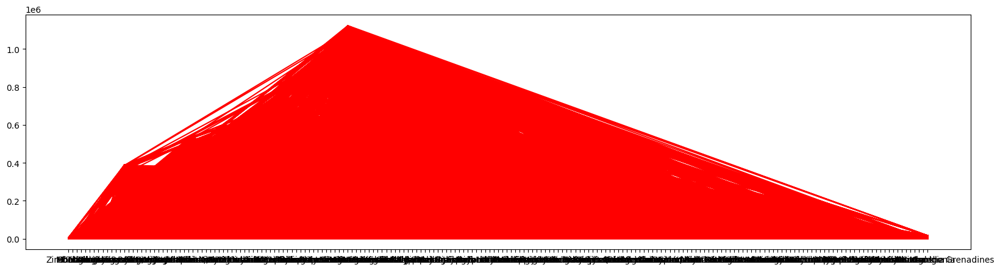

In [69]:
#visualising this record alone
import matplotlib.pyplot as plt
import seaborn as sns
plt.figure(figsize=(20,5))
plt.plot(new_df_covid_data['Country/Region'],new_df_covid_data['Deaths'],color='red')
plt.xticks(rotation=90)
plt.show()


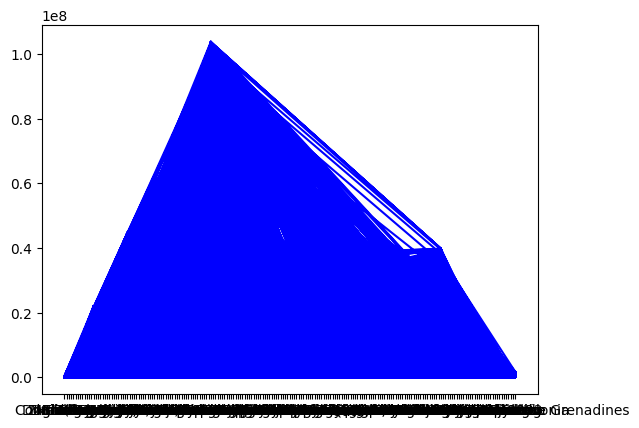

In [71]:
plt.plot(new_df_covid_data['Country/Region'],new_df_covid_data['confirmed'],color='blue')
plt.show()


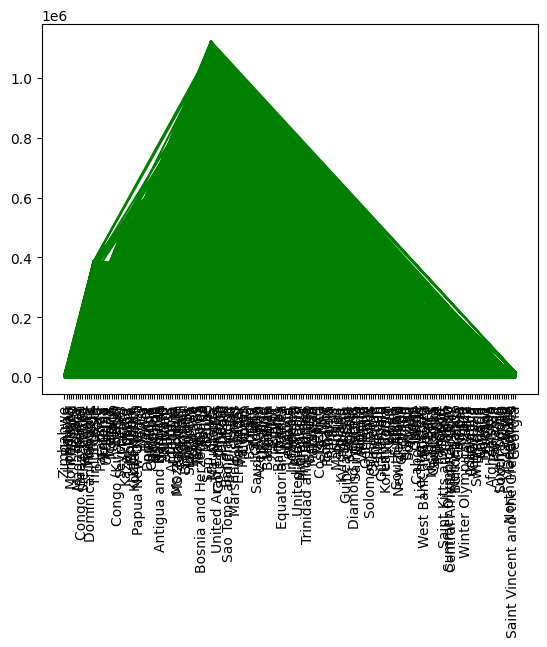

In [72]:
plt.plot(new_df_covid_data['Country/Region'],new_df_covid_data['Recovered'],color='green')
plt.xticks(rotation=90)
plt.show()


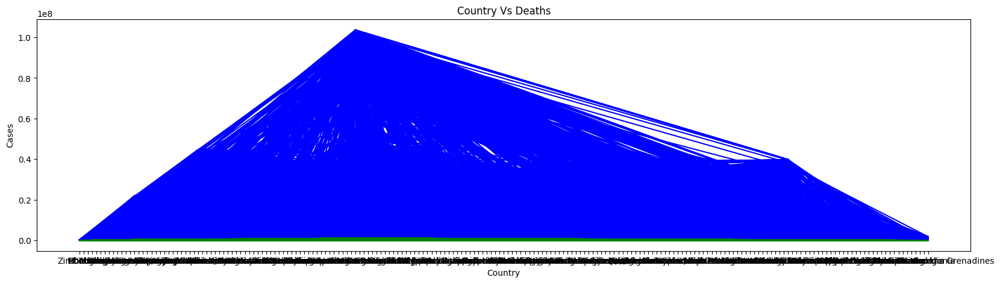

In [73]:
import matplotlib.pyplot as plt
import seaborn as sns
plt.figure(figsize=(20,5))
plt.plot(new_df_covid_data['Country/Region'],new_df_covid_data['Deaths'],color='red')
plt.plot(new_df_covid_data['Country/Region'],new_df_covid_data['confirmed'],color='blue')
plt.plot(new_df_covid_data['Country/Region'],new_df_covid_data['Recovered'],color='green')
plt.title('Country Vs Deaths')
plt.xlabel('Country')
plt.ylabel('Cases')
plt.savefig('covid_data.png')
plt.show()


In [74]:
import plotly.express as px
import plotly.io as pio
pio.templates.default='plotly_dark'
fig=px.bar(new_df_covid_data,x='Country/Region',y='confirmed',title='World covid 19 cases')
fig.show()

In [75]:
#plotly is for 3d and matplotlib is for 2-d
import plotly.express as px
import plotly.io as pio
pio.templates.default='plotly_dark'
fig=px.line(new_df_covid_data,x='Country/Region',y='confirmed',title='World covid 19 cases')
fig.show()

In [ ]:
'''
DS ---What is next DA will do  Ml part also some times like based on historical data analyse and predict future data

ML---Based on historical data analyse and predict future
---DS ---will give solution -like how to reduce covid cases in 2020,2030
DA --will just analyse the data and predict the future also if required


'''